/Users/Magali/.local/lib/python3.8/site-packages/healpy/fitsfunc.py:368: UserWarning: If you are not specifying the input dtype and using the default np.float64 dtype of read_map(), please consider that it will change in a future version to None as to keep the same dtype of the input file: please explicitly set the dtype if it is important to you.
  warnings.warn(
/Users/Magali/.local/lib/python3.8/site-packages/healpy/fitsfunc.py:391: UserWarning: NSIDE = 2048
  warnings.warn("NSIDE = {0:d}".format(nside))
/Users/Magali/.local/lib/python3.8/site-packages/healpy/fitsfunc.py:400: UserWarning: ORDERING = NESTED in fits file
  warnings.warn("ORDERING = {0:s} in fits file".format(ordering))
/Users/Magali/.local/lib/python3.8/site-packages/healpy/fitsfunc.py:426: UserWarning: No INDXSCHM keyword in header file : assume IMPLICIT
  warnings.warn("No INDXSCHM keyword in header file : " "assume {}".format(schm))
/Users/Magali/.local/lib/python3.8/site-packages/healpy/fitsfunc.py:428: UserWarnin

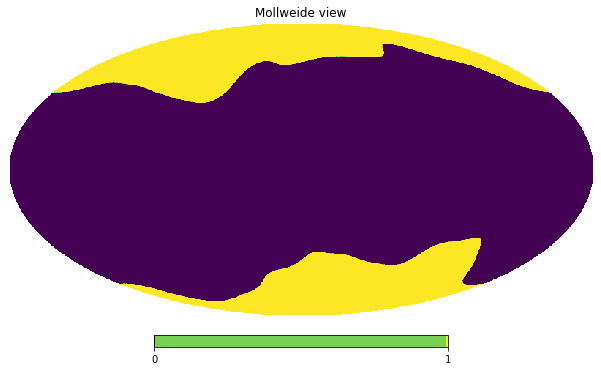

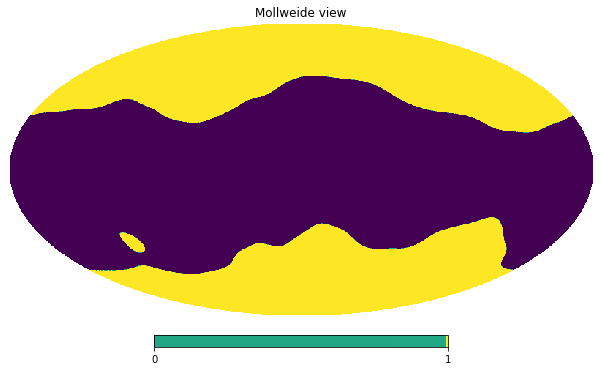

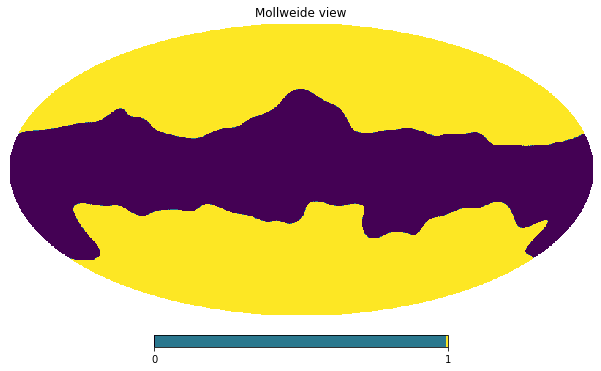

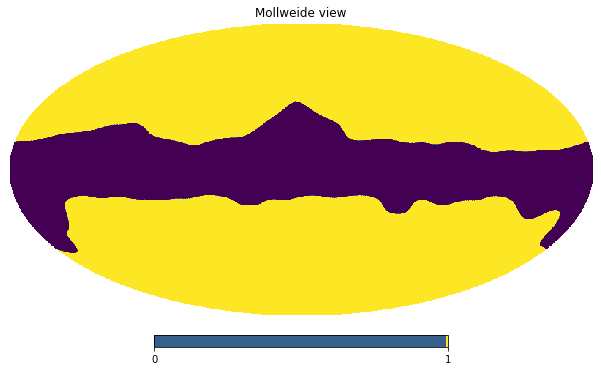

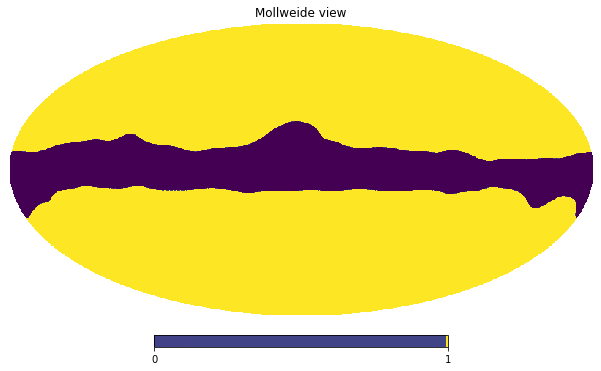

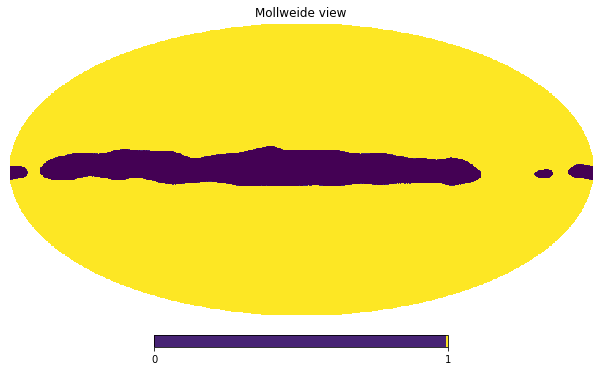

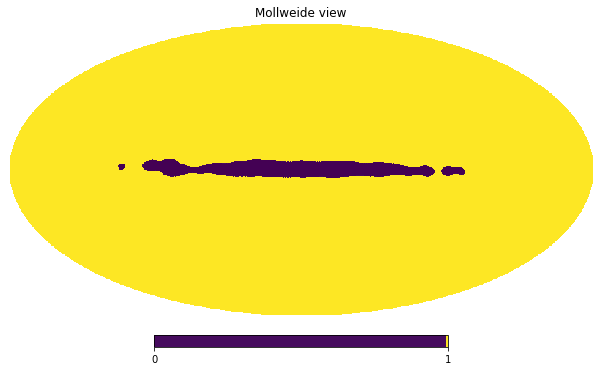

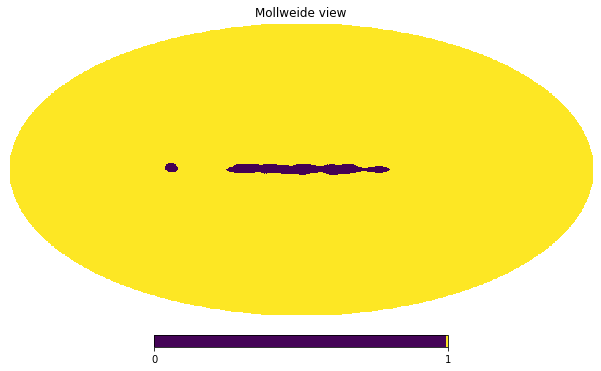

In [2]:
import healpy as hp
import numpy as np
import math
from  matplotlib import pyplot as plt

# Obtaining the masks with the same Nside as the maps

gal_mask = []
degraded_masks = []

for i in range(0,8): # there are 8 masks
    gal_mask.append(hp.read_map('./HFI_Mask_GalPlane-apo0_2048_R2.00.fits', field=i))
    degraded_masks.append(hp.pixelfunc.ud_grade(gal_mask[i], nside_out=512))
    hp.mollview(degraded_masks[i], norm='hist')

/Users/Magali/.local/lib/python3.8/site-packages/healpy/fitsfunc.py:391: UserWarning: NSIDE = 512
  warnings.warn("NSIDE = {0:d}".format(nside))
/Users/Magali/.local/lib/python3.8/site-packages/healpy/fitsfunc.py:400: UserWarning: ORDERING = RING in fits file
  warnings.warn("ORDERING = {0:s} in fits file".format(ordering))
/Users/Magali/.local/lib/python3.8/site-packages/healpy/visufunc.py:195: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  f = pylab.figure(fig, figsize=(8.5, 5.4))


(8, 5, 3145728)


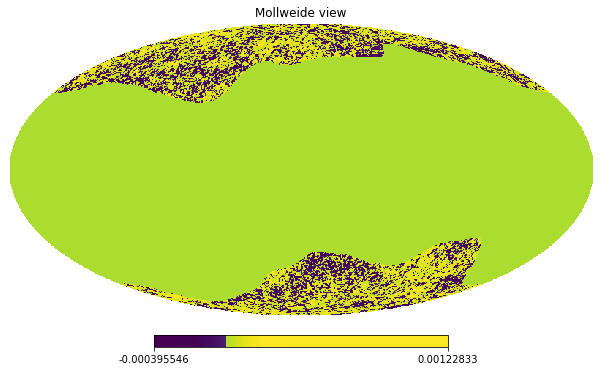

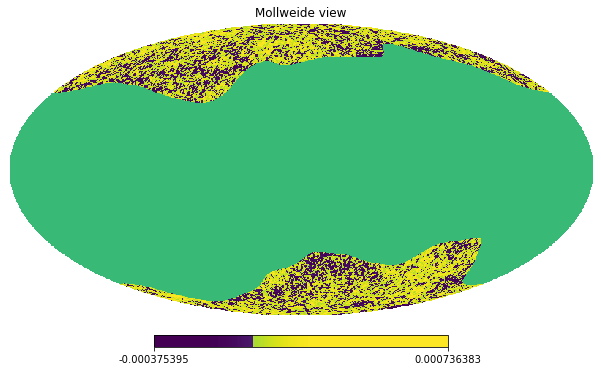

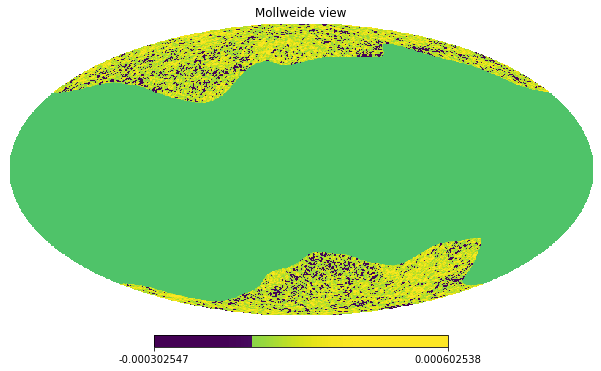

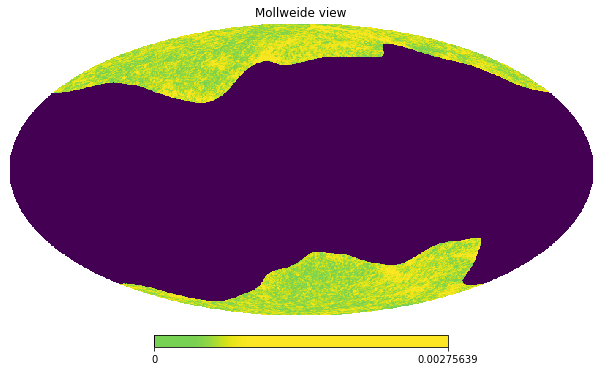

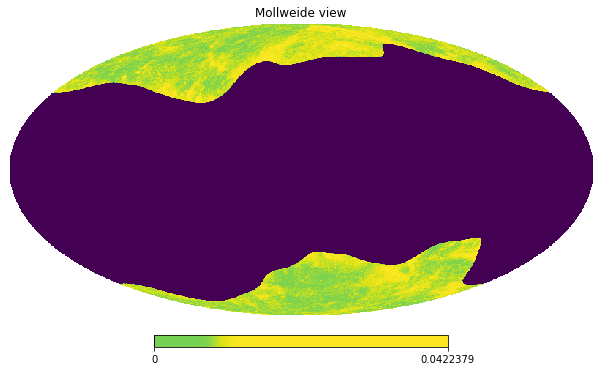

...

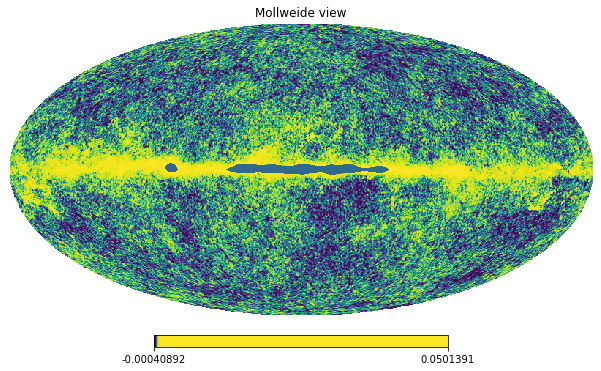

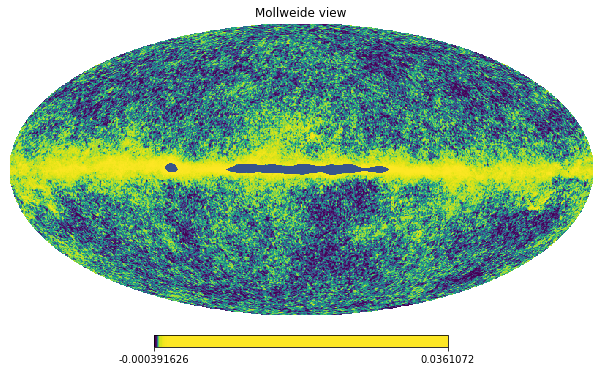

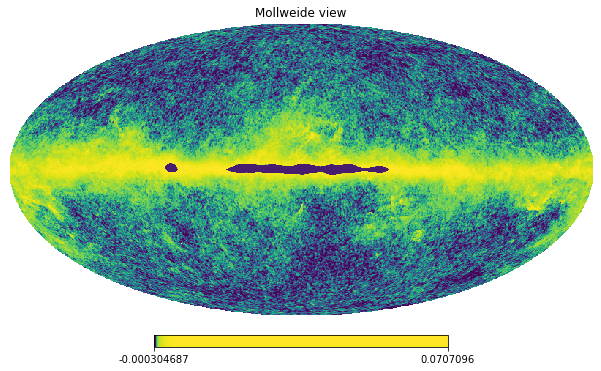

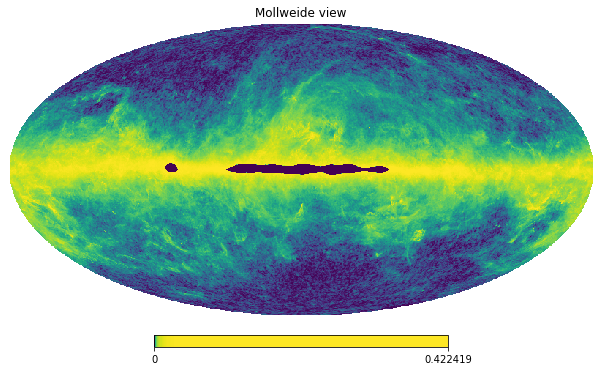

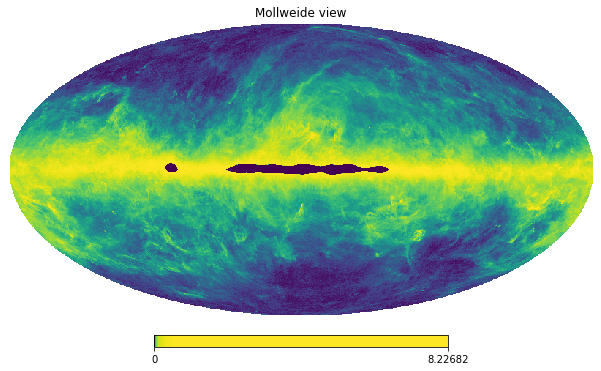

In [3]:
# Obtaining the new maps with the masks

maps_file = [hp.fitsfunc.read_map('GHz100_smoothed_512'), hp.fitsfunc.read_map('GHz143_smoothed_512'), hp.fitsfunc.read_map('GHz217_smoothed_512'), hp.fitsfunc.read_map('GHz353_smoothed_512'), hp.fitsfunc.read_map('GHz545_smoothed_512_KCMB')]
maps_with_mask = []

for i in range(0,8): #for each mask
    new_maps = []
    for j in range(0,5): #for each map
        new_maps.append(maps_file[j]*degraded_masks[i])
        hp.mollview(maps_file[j]*degraded_masks[i], norm='hist')
    maps_with_mask.append(new_maps)

print(np.shape(maps_with_mask))
# maps_with_mask[i] contains the 5 maps with the mask n°i


MASK N° 0 : 
w_100= -0.3738820696597961 , w_143= 1.3624408044193699 , w_217= 0.00210124835854575 , w_353= 0.014993885419916366 , w_535= -0.005653868538035943

MASK N° 1 : 
w_100= -0.41213963240962365 , w_143= 1.6622082710224373 , w_217= -0.13492341381194622 , w_353= -0.11989022589025244 , w_535= 0.00474500108938487

MASK N° 2 : 
w_100= -0.4792566331058991 , w_143= 1.433002377712169 , w_217= 0.15282070540691323 , w_353= -0.10878512692123286 , w_535= 0.0022186769080499323

MASK N° 3 : 
w_100= -0.38358791429470096 , w_143= 1.1325176733961508 , w_217= 0.36553323852569314 , w_353= -0.11595159946285928 , w_535= 0.0014886018357162837

MASK N° 4 : 
w_100= -0.8662983824140215 , w_143= 1.04375444374964 , w_217= 0.9820122420809982 , w_353= -0.15954052480742748 , w_535= 7.222139081077701e-05

MASK N° 5 : 
w_100= -0.9063278114914861 , w_143= 1.045265741500357 , w_217= 1.0968837211745637 , w_353= -0.23966905554915707 , w_535= 0.003847404365722565

MASK N° 6 : 
w_100= -0.9381304776030954 , w_143= 1.

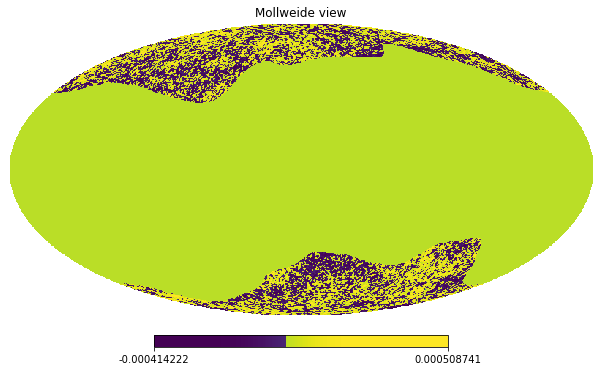

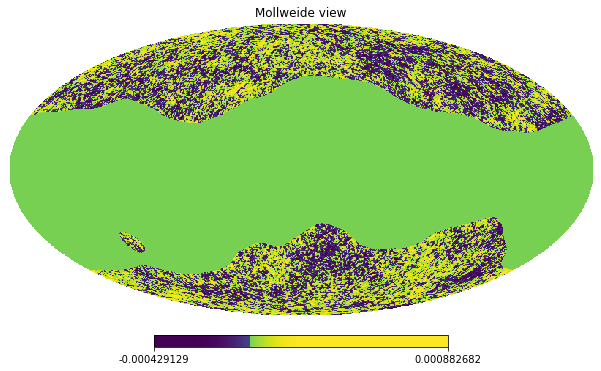

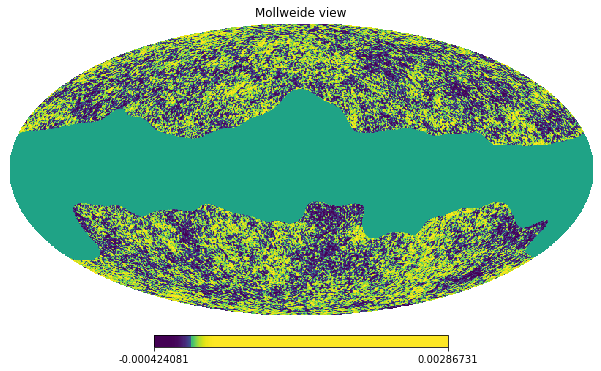

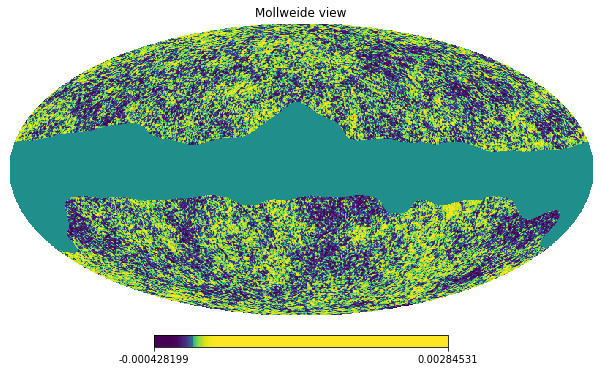

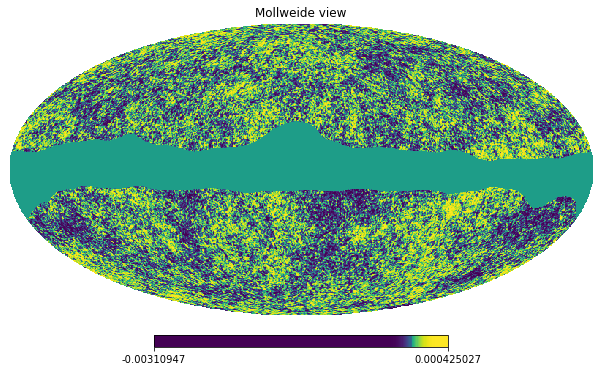

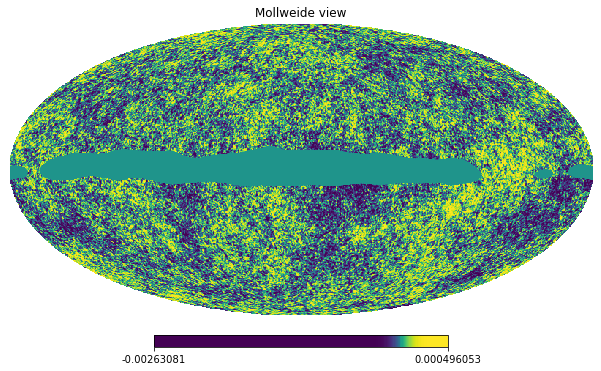

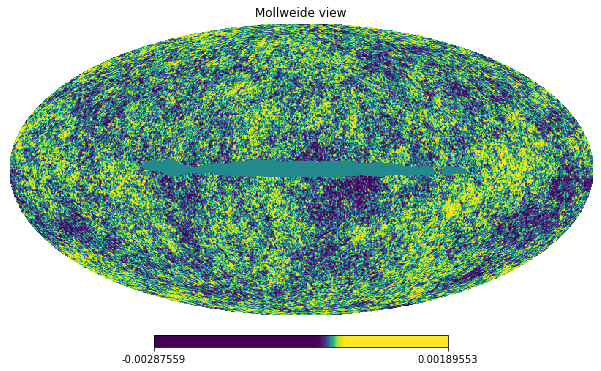

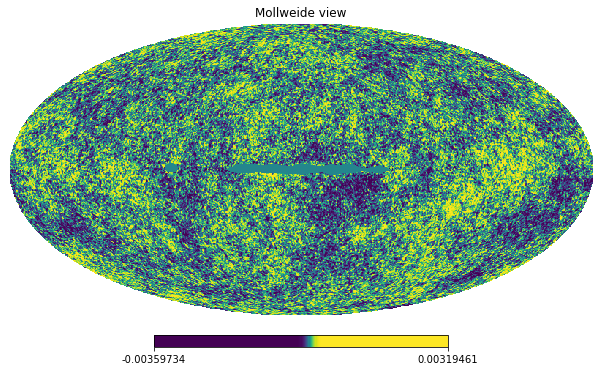

In [8]:
# Computing the weights {w_i} for each map, and computing the new CMB maps

n = len(maps_with_mask) # number of masks
M = []                  # list with all the vectors, for each mask (ex: M[1][2] = 3rd map for the 2nd mask)
w = []                  # list with all the factors w, for each mask (ex: w[1][2] = w of the 3rd map for the 2nd mask)
CMB_maps = []           # list of the new CMB maps
I = np.ones(5).T

for i in range(n): #for each mask
    M.append(np.array([maps_with_mask[i][j].T for j in range(5)]))

    covariance_matrix = np.cov(M[i])
    inverse = np.linalg.inv(covariance_matrix)

    numerator = inverse.dot(I) # C^-1 x I
    denominator = I.T.dot(inverse.dot(I)) # I.T x C^-1 x I
    w.append(numerator/denominator)
    print('\nMASK N°', i, ':', '\nw_100=', w[i][0], ', w_143=', w[i][1], ', w_217=', w[i][2], ', w_353=', w[i][3], ', w_535=', w[i][4])
    #print('sum of w_i = ', w[i][0]+w[i][1]+w[i][2]+w[i][3]+w[i][4]) # Sum of w_i must be 1

    T_CMB = 0
    for j in range(5):
        T_CMB += w[i][j]*maps_with_mask[i][j] # new CMB map for each mask i
    CMB_maps.append(T_CMB)
    hp.mollview(CMB_maps[i], norm='hist')


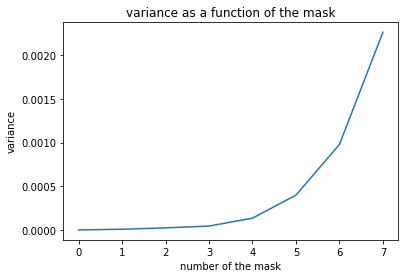

In [15]:
# Computing of the variance as a function of the mask

variance = []
mask = [i for i in range(n)] # number of the mask

for i in range(n): #for each mask
    variance.append(np.var(maps_with_mask[i]))

plt.title('variance as a function of the mask')
plt.xlabel('number of the mask')
plt.ylabel('variance')
plt.plot(mask, variance)
plt.show()

for the mask number 4 : w_100= -0.8662983824140215 , w_143= 1.04375444374964 , w_217= 0.9820122420809982 , w_353= -0.15954052480742748 , w_535= 7.222139081077701e-05


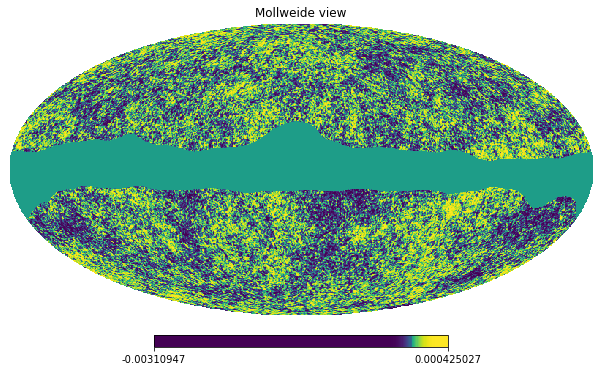

In [17]:
# Choice of the weights {w_i} and the good mask to use to compute the CMB

# Mask n°4 seems to be the smallest mask with the smallest variance, so we keep this one

i = 4  # we choose to keep mask n°4 (Gal080)
w_CMB = w[i]
print('for the mask number', i, ':', 'w_100=', w[i][0], ', w_143=', w[i][1], ', w_217=', w[i][2], ', w_353=', w[i][3], ', w_535=', w[i][4])
hp.mollview(CMB_maps[i], norm='hist')

#hp.fitsfunc.write_map('CMB_map_mask', CMB_maps[i])

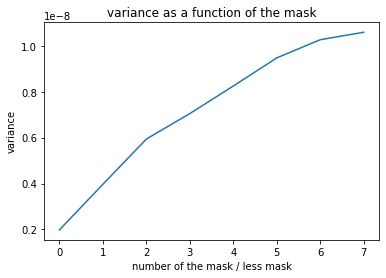

In [13]:
variance2 = []
mask2 = [i for i in range(n)] # number of the mask
# [Gal20, Gal40, Gal60, Gal70, Gal80, Gal90, Gal97, Gal99]

for i in range(n): #for each mask
    variance2.append(np.var(CMB_maps[i]))

plt.title('variance as a function of the mask')
plt.xlabel('number of the mask / less mask')
plt.ylabel('variance')
plt.plot(mask2, variance2)
plt.show()